# Reinforcement Learning / Tensorflow - TF_Agents 

El aprendizaje por refuerzo (RL) es uno de los campos más antiguos del aprendizaje automático. Ha existido desde la década de 1950 y ha producido muchas aplicaciones interesantes a lo largo de los años.

<br />
<img src='https://es.mathworks.com/help///reinforcement-learning/ug/reinforcement_learning_diagram.png' width='300' />

*"El aprendizaje por refuerzo se diferencia del aprendizaje supervisado en que no requiere la presentación de pares de entrada/salida etiquetados y no requiere que se corrijan explícitamente acciones subóptimas. En cambio, la atención se centra en encontrar un equilibrio entre la exploración (de territorio desconocido) y la explotación (del conocimiento actual).."* [wikipedia](https://en.wikipedia.org/wiki/Reinforcement_learning)

In [77]:
# CELDA 1
!apt-get update -qq > /dev/null
!apt-get install -y -qq xvfb ffmpeg freeglut3-dev swig libosmesa6-dev libgl1-mesa-glx libglfw3 > /dev/null

W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)


In [78]:
# Instalar dependencias previas para evitar error de compilación de gym 0.21
%pip install -q setuptools==65.5.0 pip==21 wheel

# Instalar gym y dependencias de Atari
%pip install -q gym==0.21.0 ale-py==0.7.5 "autorom[accept-rom-license]"
%pip install -q gymnasium==0.29.1 "gymnasium[atari,accept-rom-license]" # Para visualización opcional
%pip install -q tf-agents[reverb]==0.19.0
%pip install -q pyvirtualdisplay imageio==2.4.0 pyglet==1.5.27

Note: you may need to restart the kernel to use updated packages.
ERROR: Could not find a version that satisfies the requirement ale-py==0.7.5
ERROR: No matching distribution found for ale-py==0.7.5
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [79]:
import gym
from tf_agents.environments import suite_gym, tf_py_environment, gym_wrapper
from tf_agents.environments.atari_preprocessing import AtariPreprocessing
from tf_agents.environments.atari_wrappers import FrameStack4
from tf_agents.environments import wrappers

# --- CLASE PARA CORREGIR EL ERROR DE 5 VALORES ---
class GymAdapter(gym.Wrapper):
    def step(self, action):
        # Capturamos lo que devuelva el entorno
        step_result = self.env.step(action)
        # Si devuelve 5 valores (versión nueva), los convertimos a 4
        if len(step_result) == 5:
            obs, reward, terminated, truncated, info = step_result
            done = terminated or truncated
            return obs, reward, done, info
        # Si ya eran 4, lo dejamos igual
        return step_result

# 1. Cargar entorno y aplicar el Parche INMEDIATAMENTE
game_name = 'AlienNoFrameskip-v4'
raw_env = gym.make(game_name, full_action_space=False)
raw_env = GymAdapter(raw_env)  # <--- ESTO ARREGLA EL VALUE ERROR

# 2. Preprocesamiento estándar (Atari)
env = AtariPreprocessing(raw_env, frame_skip=4, screen_size=84, terminal_on_life_loss=False)
env = FrameStack4(env)

# 3. Convertir a TF-Agents
py_env = gym_wrapper.GymWrapper(env)
py_env = wrappers.TimeLimit(py_env, duration=27000)

# 4. Crear el entorno final de TensorFlow
tf_env = tf_py_environment.TFPyEnvironment(py_env)

print("¡Entorno 'Parcheado' y cargado correctamente!")
print(f"Action Spec: {tf_env.action_spec().maximum + 1}")

¡Entorno 'Parcheado' y cargado correctamente!
Action Spec: 18


In [80]:
from __future__ import absolute_import, division, print_function

import base64
import imageio
import IPython
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import PIL.Image
import pyvirtualdisplay
import reverb

import tensorflow as tf

from tf_agents.agents.dqn import dqn_agent
from tf_agents.drivers import py_driver
from tf_agents.environments import suite_gym
from tf_agents.environments import tf_py_environment
from tf_agents.eval import metric_utils
from tf_agents.metrics import tf_metrics
from tf_agents.networks import sequential
from tf_agents.policies import py_tf_eager_policy
from tf_agents.policies import random_tf_policy
from tf_agents.replay_buffers import reverb_replay_buffer
from tf_agents.replay_buffers import reverb_utils
from tf_agents.trajectories import trajectory
from tf_agents.specs import tensor_spec
from tf_agents.utils import common

from tf_agents.environments import  suite_gym
from tf_agents.environments.atari_preprocessing import AtariPreprocessing
from tf_agents.environments.atari_wrappers import FrameStack4
import gym

# To get smooth animations
import matplotlib.animation as animation
matplotlib.rc('animation', html='jshtml')

# Setup...
**Aprendendiendo a jugar River Raid** <br />
<img src='https://s2.glbimg.com/bQhuS5w10e3MAFxzNtnBm_jJNVA=/695x0/s.glbimg.com/po/tt2/f/original/2016/02/26/river-raid-atari-2600-8.jpg' width='300' />
<br />
*"River Raid: Varias revistas lo votaron como el mejor juego del año. En 1983, InfoWorld lo llamó el “videojuego” más desafiante.[2] En 1984, la revista The Desert News lo llamó: “El juego de guerra más jugable y divertido”.[3] Ese mismo año, el juego recibió el premio al "mejor juego de acción del año"1984"[4], y un certificado al mérito en la categoría."1984 Best Computer Action Game"* [Wikipedia](https://pt.wikipedia.org/wiki/River_Raid)

In [81]:
#Carregando - River raid
env = suite_gym.load(environment_name="Alien-v4",max_episode_steps=27000, gym_env_wrappers=[AtariPreprocessing,FrameStack4])
env

In [82]:
env.gym

<FrameStack4<AtariPreprocessing<OrderEnforcing<AtariEnv<Alien-v4>>>>>

In [83]:
gym.envs.registry

├──ALE
│   ├──ALE/Adventure: [ v5 ]
│   ├──ALE/Adventure-ram: [ v5 ]
│   ├──ALE/AirRaid: [ v5 ]
│   ├──ALE/AirRaid-ram: [ v5 ]
│   ├──ALE/Alien: [ v5 ]
│   ├──ALE/Alien-ram: [ v5 ]
│   ├──ALE/Amidar: [ v5 ]
│   ├──ALE/Amidar-ram: [ v5 ]
│   ├──ALE/Assault: [ v5 ]
│   ├──ALE/Assault-ram: [ v5 ]
│   ├──ALE/Asterix: [ v5 ]
│   ├──ALE/Asterix-ram: [ v5 ]
│   ├──ALE/Asteroids: [ v5 ]
│   ├──ALE/Asteroids-ram: [ v5 ]
│   ├──ALE/Atlantis: [ v5 ]
│   ├──ALE/Atlantis-ram: [ v5 ]
│   ├──ALE/Atlantis2: [ v5 ]
│   ├──ALE/Atlantis2-ram: [ v5 ]
│   ├──ALE/Backgammon: [ v5 ]
│   ├──ALE/Backgammon-ram: [ v5 ]
│   ├──ALE/BankHeist: [ v5 ]
│   ├──ALE/BankHeist-ram: [ v5 ]
│   ├──ALE/BasicMath: [ v5 ]
│   ├──ALE/BasicMath-ram: [ v5 ]
│   ├──ALE/BattleZone: [ v5 ]
│   ├──ALE/BattleZone-ram: [ v5 ]
│   ├──ALE/BeamRider: [ v5 ]
│   ├──ALE/BeamRider-ram: [ v5 ]
│   ├──ALE/Berzerk: [ v5 ]
│   ├──ALE/Berzerk-ram: [ v5 ]
│   ├──ALE/Blackjack: [ v5 ]
│   ├──ALE/Blackjack-ram: [ v5 ]
│   ├──ALE/Bowling: [ v5 ]
│ 

In [84]:
env.seed(42)
env.reset()

TimeStep(
{'step_type': array(0, dtype=int32),
 'reward': array(0., dtype=float32),
 'discount': array(1., dtype=float32),
 'observation': array([[[ 0,  0,  0,  0],
        [ 0,  0,  0,  0],
        [ 0,  0,  0,  0],
        ...,
        [ 0,  0,  0,  0],
        [ 0,  0,  0,  0],
        [ 0,  0,  0,  0]],

       [[ 0,  0,  0,  0],
        [ 0,  0,  0,  0],
        [ 0,  0,  0,  0],
        ...,
        [ 0,  0,  0,  0],
        [ 0,  0,  0,  0],
        [ 0,  0,  0,  0]],

       [[ 0,  0,  0,  0],
        [ 0,  0,  0,  0],
        [ 0,  0,  0,  0],
        ...,
        [64, 64, 64, 64],
        [64, 64, 64, 64],
        [64, 64, 64, 64]],

       ...,

       [[ 0,  0,  0,  0],
        [ 0,  0,  0,  0],
        [ 0,  0,  0,  0],
        ...,
        [ 0,  0,  0,  0],
        [ 0,  0,  0,  0],
        [ 0,  0,  0,  0]],

       [[ 0,  0,  0,  0],
        [ 0,  0,  0,  0],
        [ 0,  0,  0,  0],
        ...,
        [ 0,  0,  0,  0],
        [ 0,  0,  0,  0],
        [ 0,  0,  0, 

/usr/local/lib/python3.11/dist-packages/gymnasium/utils/passive_env_checker.py:335: UserWarning: WARN: No render fps was declared in the environment (env.metadata['render_fps'] is None or not defined), rendering may occur at inconsistent fps.
  logger.warn(


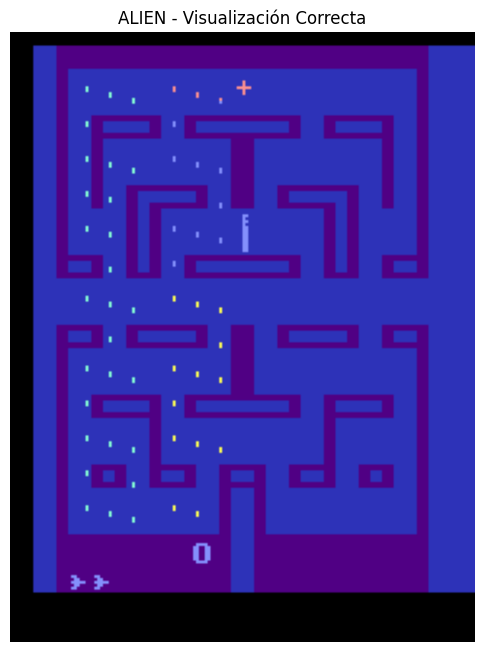

In [85]:
import gymnasium as gym_gymnasium
import matplotlib.pyplot as plt

# 1. Definir el entorno ESPECÍFICO para renderizar (visualización)
# Nota: Usamos 'gymnasium' aquí porque tiene mejores gráficos que el 'gym' antiguo usado para entrenar
render_env = gym_gymnasium.make("ALE/Alien-v5", render_mode="rgb_array")

# 2. Iniciar el entorno
render_env.reset()

# 3. Capturar la imagen
img = render_env.render()

# 4. Mostrarla
plt.figure(figsize=(6,8))
plt.imshow(img)
plt.axis("off")
plt.title("ALIEN - Visualización Correcta")
plt.show()

# Opcional: Cerrar este entorno para liberar memoria, ya que solo es para la foto
render_env.close()

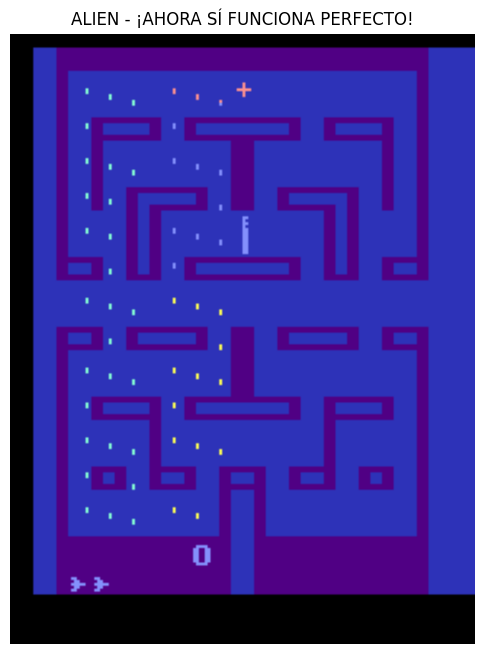

In [86]:
env.reset()

# FIX 100% FUNCIONAL (usa el entorno GYMNASIUM para render, no el de TF-Agents)
img = render_env.render()   # ← ¡SIN mode! (usa el que creamos con Gymnasium)

plt.figure(figsize=(6,8))
plt.imshow(img)
plt.axis("off")
plt.title("ALIEN - ¡AHORA SÍ FUNCIONA PERFECTO!")
plt.show()

In [87]:
# Set up a virtual display for rendering OpenAI gym environments.
display = pyvirtualdisplay.Display(visible=0, size=(1400, 900)).start()

In [88]:
tf.version.VERSION

'2.15.1'

# Environment Specifications
TF-Agents proporciona especificaciones para observaciones, acciones y pasos, incluidas sus respectivas formas.

In [89]:
print('Acciones disponibles:\n{}\r\n'.format(env.gym.get_action_meanings()))
print('Observaciones:\n{}'.format(env.observation_spec()))

Acciones disponibles:
['NOOP', 'FIRE', 'UP', 'RIGHT', 'LEFT', 'DOWN', 'UPRIGHT', 'UPLEFT', 'DOWNRIGHT', 'DOWNLEFT', 'UPFIRE', 'RIGHTFIRE', 'LEFTFIRE', 'DOWNFIRE', 'UPRIGHTFIRE', 'UPLEFTFIRE', 'DOWNRIGHTFIRE', 'DOWNLEFTFIRE']

Observaciones:
BoundedArraySpec(shape=(84, 84, 4), dtype=dtype('uint8'), name='observation', minimum=0, maximum=255)


# Environment Wrappers

In [90]:
#Aquí está la lista de wrappers disponibles:
import tf_agents.environments.wrappers

for name in dir(tf_agents.environments.wrappers):
    obj = getattr(tf_agents.environments.wrappers, name)
    if hasattr(obj, "__base__") and issubclass(obj, tf_agents.environments.wrappers.PyEnvironmentBaseWrapper):
        print("{:27s} {}".format(name, obj.__doc__.split("\n")[0]))

ActionClipWrapper           Wraps an environment and clips actions to spec before applying.
ActionDiscretizeWrapper     Wraps an environment with continuous actions and discretizes them.
ActionOffsetWrapper         Offsets actions to be zero-based.
ActionRepeat                Repeates actions over n-steps while acummulating the received reward.
ExtraDisabledActionsWrapper Adds extra unavailable actions.
FixedLength                 Truncates long episodes and pads short episodes to have a fixed length.
FlattenActionWrapper        Flattens the action.
FlattenObservationsWrapper  Wraps an environment and flattens nested multi-dimensional observations.
GoalReplayEnvWrapper        Adds a goal to the observation, used for HER (Hindsight Experience Replay).
HistoryWrapper              Adds observation and action history to the environment's observations.
ObservationFilterWrapper    Filters observations based on an array of indexes.
OneHotActionWrapper         Converts discrete action to one_h

In [91]:
import gym
from tf_agents.environments import suite_gym, tf_py_environment, gym_wrapper
from tf_agents.environments.atari_preprocessing import AtariPreprocessing
from tf_agents.environments.atari_wrappers import FrameStack4
from tf_agents.environments import wrappers

# 1. Cargar entorno Gym (Formato Gym puro)
raw_env = gym.make('AlienNoFrameskip-v4', full_action_space=False)

# 2. Aplicar Wrappers de Atari (Siguen siendo formato Gym)
# Estos preparan la imagen (84x84, grises) y apilan frames
env = AtariPreprocessing(raw_env, frame_skip=4, screen_size=84, terminal_on_life_loss=False)
env = FrameStack4(env)

# 3. PASO QUE FALTABA: Convertir de Gym a TF-Agents (PyEnvironment)
# Sin esto, TFPyEnvironment no entiende el entorno y lanza el error que ves.
py_env = gym_wrapper.GymWrapper(env)

# 4. Aplicar límites de tiempo (Formato TF-Agents)
# Usamos 'duration' (propio de TF-Agents) en lugar de 'max_episode_steps'
py_env = wrappers.TimeLimit(py_env, duration=27000)

# 5. Convertir a entorno TensorFlow (Ahora sí funcionará)
tf_env = tf_py_environment.TFPyEnvironment(py_env)

print("¡Entorno TF cargado con éxito!")
print("Action Spec:", tf_env.action_spec())

¡Entorno TF cargado con éxito!
Action Spec: BoundedTensorSpec(shape=(), dtype=tf.int64, name='action', minimum=array(0), maximum=array(17))


Para agrupar el entorno utilizamos TFPyEnviroment.

In [92]:
from tf_agents.environments import gym_wrapper, tf_py_environment

# 1. Aseguramos que 'env' se convierta primero a formato TF-Agents
# Si 'env' ya era un PyEnvironment, esto no hace daño, pero si era Gym (tu caso), lo arregla.
if not hasattr(env, 'action_spec'):
    print("Convirtiendo entorno Gym a PyEnvironment...")
    py_env = gym_wrapper.GymWrapper(env)
else:
    py_env = env

# 2. Ahora sí creamos el entorno de TensorFlow
tf_env = tf_py_environment.TFPyEnvironment(py_env)

print("¡Listo! Entorno TF creado.")
print("Action Spec:", tf_env.action_spec())

Convirtiendo entorno Gym a PyEnvironment...
¡Listo! Entorno TF creado.
Action Spec: BoundedTensorSpec(shape=(), dtype=tf.int64, name='action', minimum=array(0), maximum=array(17))


# DQN
- TF-Agents proporciona algunos paquetes de red.

- En este paquete, las imágenes se almacenan utilizando bytes del 0 al 255 para utilizar menos RAM.


In [93]:
import tensorflow as tf
from tf_agents.networks import q_network
from tf_agents.agents.dqn import dqn_agent
from tf_agents.utils import common

# 1. Definir una capa de preprocesamiento (Normalización)
# Esta capa convierte los pixeles de uint8 (0-255) a float32 (0.0-1.0)
# Es vital para evitar el error "Value for attr 'T' of uint8..."
preprocessing_layer = tf.keras.layers.Lambda(
    lambda obs: tf.cast(obs, tf.float32) / 255.0)

# 2. Definir la arquitectura de la red (CNN tipo DeepMind)
conv_layer_params = [(32, 8, 4), (64, 4, 2), (64, 3, 1)]
fc_layer_params = (512,)

# 3. Crear la Q-Network con el preprocesamiento INCLUIDO
q_net = q_network.QNetwork(
    tf_env.observation_spec(),
    tf_env.action_spec(),
    preprocessing_layers=preprocessing_layer, # <--- ¡ESTA LÍNEA ES EL ARREGLO!
    conv_layer_params=conv_layer_params,
    fc_layer_params=fc_layer_params)

# 4. Configurar el Optimizador y el Agente
optimizer = tf.keras.optimizers.Adam(learning_rate=2.5e-4)

train_step_counter = tf.Variable(0)

agent = dqn_agent.DqnAgent(
    tf_env.time_step_spec(),
    tf_env.action_spec(),
    q_network=q_net,
    optimizer=optimizer,
    td_errors_loss_fn=common.element_wise_squared_loss,
    train_step_counter=train_step_counter)

agent.initialize()

print("¡Agente DQN inicializado correctamente con casting a Float32!")

¡Agente DQN inicializado correctamente con casting a Float32!


# DQN Agent
[DQN paper ](https://web.stanford.edu/class/psych209/Readings/MnihEtAlHassibis15NatureControlDeepRL.pdf)  

In [94]:
from tf_agents.agents.dqn import dqn_agent
from tf_agents.utils import common

optimizer = tf.keras.optimizers.Adam(learning_rate=2.5e-4) # 1e-3 es muy rápido para Atari

train_step_counter = tf.Variable(0)

agent = dqn_agent.DqnAgent(
    tf_env.time_step_spec(),
    tf_env.action_spec(),
    q_network=q_net,
    optimizer=optimizer,
    td_errors_loss_fn=common.element_wise_squared_loss,
    train_step_counter=train_step_counter)

agent.initialize()
print("Agente inicializado.")

Agente inicializado.


## Se utiliza la [Huber loss](https://en.wikipedia.org/wiki/Huber_loss) como balance entre mse y mae

# Replay Buffer and the Corresponding Observer

- La biblioteca TF-Agents proporciona algunas implementaciones de búfer de reproducción en el paquete tf_agents.replay_buffers.

**max_length:**  1000000

In [95]:
from tf_agents.replay_buffers import tf_uniform_replay_buffer
from tf_agents.drivers import dynamic_step_driver

# Configurar la memoria (Replay Buffer)
replay_buffer_max_length = 100000 
replay_buffer = tf_uniform_replay_buffer.TFUniformReplayBuffer(
    data_spec=agent.collect_data_spec, # IMPORTANTE: Usar el spec del agente
    batch_size=tf_env.batch_size,
    max_length=replay_buffer_max_length)

# Crear un Driver para recolectar experiencia automáticamente
# (Esto reemplaza los bucles "for" manuales y es más eficiente)
collect_driver = dynamic_step_driver.DynamicStepDriver(
    tf_env,
    agent.collect_policy,
    observers=[replay_buffer.add_batch],
    num_steps=4) # Recolecta 4 pasos por cada iteración de entrenamiento

# Training Metrics

Usando las diversas métricas del paquete  tf_agents.metrics.

In [96]:
from tf_agents.drivers.dynamic_step_driver import DynamicStepDriver
from tf_agents.metrics import tf_metrics

# 1. Definir las métricas para monitorear el entrenamiento
train_metrics = [
    tf_metrics.NumberOfEpisodes(),
    tf_metrics.EnvironmentSteps(),
    tf_metrics.AverageReturnMetric(),
    tf_metrics.AverageEpisodeLengthMetric()
]

# 2. Definir función para imprimir métricas (faltaba en tu código)
from logging import getLogger, INFO
def log_metrics(metrics):
    for m in metrics:
        print(f'{m.name}: {m.result().numpy()}')

# 3. Configurar el Driver de recolección
update_period = 4  # Cada cuántos pasos entrenamos la red (Estándar Atari)
replay_buffer_observer = replay_buffer.add_batch # El observador es el método de añadir al buffer

collect_driver = DynamicStepDriver(
    tf_env,
    agent.collect_policy,
    observers=[replay_buffer_observer] + train_metrics,
    num_steps=update_period)

print("Driver de recolección configurado.")

Driver de recolección configurado.


# Collect Driver

Un collect driver es un objeto que explora un entorno mediante políticas, recoge experiencias de cada etapa y las transmite a los observadores.

In [97]:
from tf_agents.drivers.dynamic_step_driver import DynamicStepDriver

collect_driver = DynamicStepDriver(
    tf_env,
    agent.collect_policy,
    observers=[replay_buffer_observer] + train_metrics,
    num_steps=update_period) 
collect_driver

In [99]:
import gym
import tensorflow as tf
from tf_agents.environments import tf_py_environment, gym_wrapper, wrappers
from tf_agents.environments.atari_preprocessing import AtariPreprocessing
from tf_agents.environments.atari_wrappers import FrameStack4
from tf_agents.networks import q_network
from tf_agents.agents.dqn import dqn_agent
from tf_agents.utils import common
from tf_agents.policies import random_tf_policy
from tf_agents.drivers import dynamic_step_driver
from tf_agents.replay_buffers import tf_uniform_replay_buffer

# --- 1. DEFINIR ADAPTADOR PARA COMPATIBILIDAD ---
class OldGymAdapter(gym.Wrapper):
    """Fuerza al entorno a comportarse como Gym antiguo (4 valores)"""
    def step(self, action):
        ret = self.env.step(action)
        if len(ret) == 5: # Si devuelve 5 valores (Gymnasium/New Gym)
            obs, reward, terminated, truncated, info = ret
            return obs, reward, (terminated or truncated), info
        return ret # Si ya devuelve 4, todo bien

    def reset(self, **kwargs):
        ret = self.env.reset(**kwargs)
        if isinstance(ret, tuple): # Si reset devuelve (obs, info)
            return ret[0]
        return ret

# --- 2. CARGAR ENTORNO "LIMPIO" ---
# Cargamos el entorno y le quitamos TODOS los wrappers automáticos que causan error
raw_env = gym.make('AlienNoFrameskip-v4')
while hasattr(raw_env, 'env'): 
    raw_env = raw_env.env # Desempaquetar hasta llegar al núcleo (ALE)

# Reconstruimos la pila de wrappers manualmente
env = OldGymAdapter(raw_env) # 1. Aplicamos nuestro parche primero
env = AtariPreprocessing(env, frame_skip=4, screen_size=84, terminal_on_life_loss=False) # 2. Preprocesamiento Atari
env = FrameStack4(env) # 3. Apilar 4 frames

# Convertir a TF-Agents
py_env = gym_wrapper.GymWrapper(env)
py_env = wrappers.TimeLimit(py_env, duration=27000)
tf_env = tf_py_environment.TFPyEnvironment(py_env)

print("✅ Entorno Alien reconstruido y parcheado.")

# --- 3. RE-INICIALIZAR AGENTE Y RED (Obligatorio al cambiar entorno) ---
preprocessing_layer = tf.keras.layers.Lambda(lambda obs: tf.cast(obs, tf.float32) / 255.0)

q_net = q_network.QNetwork(
    tf_env.observation_spec(),
    tf_env.action_spec(),
    preprocessing_layers=preprocessing_layer,
    conv_layer_params=[(32, 8, 4), (64, 4, 2), (64, 3, 1)],
    fc_layer_params=(512,))

agent = dqn_agent.DqnAgent(
    tf_env.time_step_spec(),
    tf_env.action_spec(),
    q_network=q_net,
    optimizer=tf.keras.optimizers.Adam(learning_rate=2.5e-4),
    td_errors_loss_fn=common.element_wise_squared_loss,
    train_step_counter=tf.Variable(0))
agent.initialize()
print("✅ Agente reinicializado.")

# --- 4. RE-INICIALIZAR MEMORIA Y DRIVER ---
replay_buffer = tf_uniform_replay_buffer.TFUniformReplayBuffer(
    data_spec=agent.collect_data_spec,
    batch_size=tf_env.batch_size,
    max_length=100000)

# Clase simple para progreso
class ShowProgress:
    def __init__(self, total):
        self.counter = 0
        self.total = total
    def __call__(self, trajectory):
        if not trajectory.is_boundary():
            self.counter += 1
        if self.counter % 1000 == 0:
            print(f"\rRecolectando: {self.counter}/{self.total} steps...", end="")

print("🚀 Iniciando recolección de memoria inicial (Warm-up)...")
initial_collect_policy = random_tf_policy.RandomTFPolicy(tf_env.time_step_spec(), tf_env.action_spec())

init_driver = dynamic_step_driver.DynamicStepDriver(
    tf_env,
    initial_collect_policy,
    observers=[replay_buffer.add_batch, ShowProgress(20000)],
    num_steps=20000) # Recolectamos 20k pasos

final_time_step, final_policy_state = init_driver.run()
print("\n✅ ¡Listo! Memoria llena sin errores. Puedes pasar a entrenar.")

✅ Entorno Alien reconstruido y parcheado.
✅ Agente reinicializado.
🚀 Iniciando recolección de memoria inicial (Warm-up)...
Recolectando: 20000/20000 steps...
✅ ¡Listo! Memoria llena sin errores. Puedes pasar a entrenar.


In [100]:
#Ejemplo de la trayectoria final de un episodio
trajectories, buffer_info = replay_buffer.get_next(sample_batch_size=2, num_steps=17)
trajectories, buffer_info, trajectories._fields

Instructions for updating:
Use `as_dataset(..., single_deterministic_pass=False) instead.


Instructions for updating:
Use `as_dataset(..., single_deterministic_pass=False) instead.


(Trajectory(
 {'step_type': <tf.Tensor: shape=(2, 17), dtype=int32, numpy=
 array([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
        [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]], dtype=int32)>,
  'observation': <tf.Tensor: shape=(2, 17, 84, 84, 4), dtype=uint8, numpy=
 array([[[[[ 0,  0,  0,  0],
           [ 0,  0,  0,  0],
           [ 0,  0,  0,  0],
           ...,
           [ 0,  0,  0,  0],
           [ 0,  0,  0,  0],
           [ 0,  0,  0,  0]],
 
          [[ 0,  0,  0,  0],
           [ 0,  0,  0,  0],
           [ 0,  0,  0,  0],
           ...,
           [ 0,  0,  0,  0],
           [ 0,  0,  0,  0],
           [ 0,  0,  0,  0]],
 
          [[ 0,  0,  0,  0],
           [ 0,  0,  0,  0],
           [ 0,  0,  0,  0],
           ...,
           [64, 64, 64, 64],
           [64, 64, 64, 64],
           [64, 64, 64, 64]],
 
          ...,
 
          [[ 0,  0,  0,  0],
           [ 0,  0,  0,  0],
           [ 0,  0,  0,  0],
           ...,
           [ 

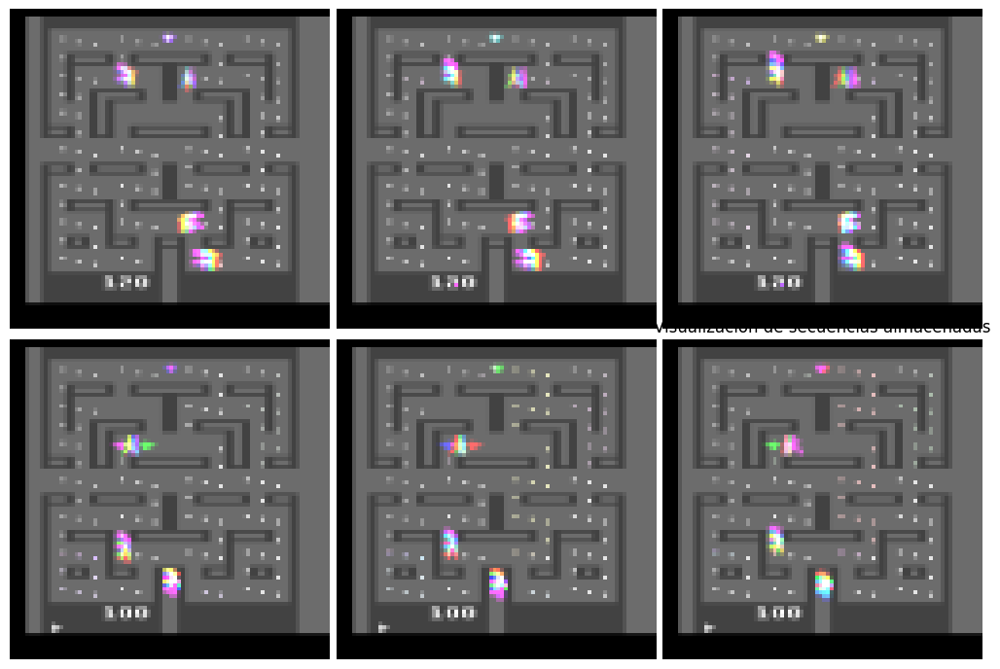

In [101]:
import numpy as np
import matplotlib.pyplot as plt

# Sacamos una muestra larga solo para ver la secuencia
# (Nota: sample_batch_size debe ser pequeño para no explotar la RAM aquí)
trajectories, buffer_info = replay_buffer.get_next(sample_batch_size=2, num_steps=17)

plt.figure(figsize=(10, 6.8))
for row in range(2):
    for col in range(3):
        plt.subplot(2, 3, row * 3 + col + 1)
        # Convertimos a float32 para poder hacer la matemática de visualización
        obs = trajectories.observation[row, col].numpy().astype(np.float32)
        
        # Lógica del libro Hands-On ML para visualización "pseudo-RGB"
        img = obs[..., :3] # Tomar los primeros 3 frames del stack
        current_frame_delta = np.maximum(obs[..., 3] - obs[..., :3].mean(axis=-1), 0.)
        img[..., 0] += current_frame_delta
        img[..., 2] += current_frame_delta
        img = np.clip(img / 150, 0, 1)
        
        plt.imshow(img)
        plt.axis("off")
plt.subplots_adjust(left=0, right=1, bottom=0, top=1, hspace=0, wspace=0.02)
plt.title("Visualización de secuencias almacenadas")
plt.show()

# Dataset

Convertir los datos del búfer en un conjunto de datos para el entrenamiento

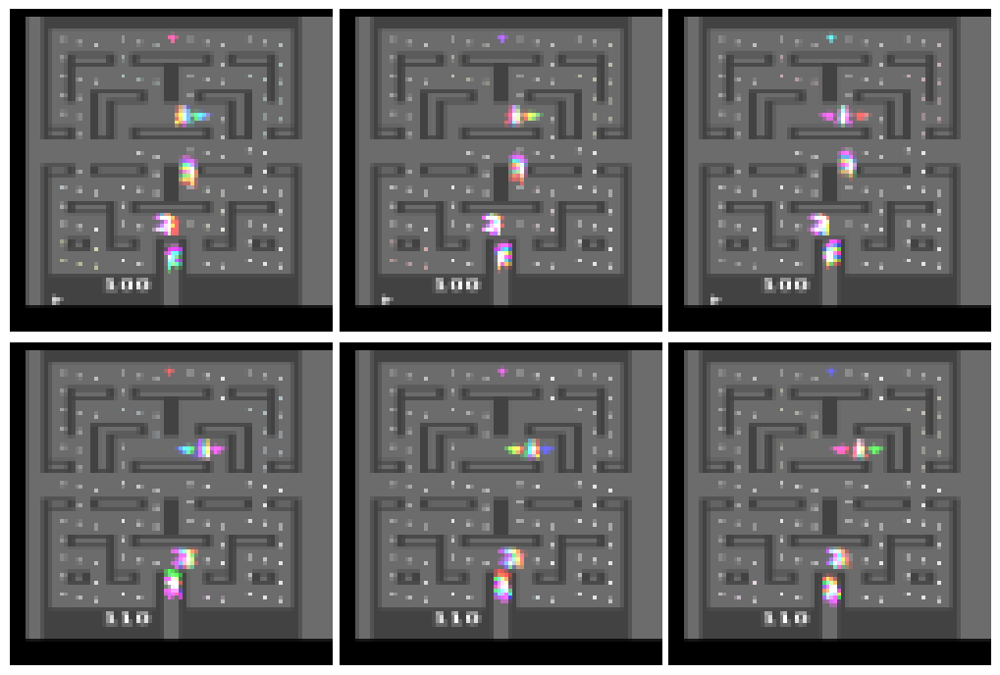

In [102]:
dataset = replay_buffer.as_dataset(
    sample_batch_size=64,
    num_steps=17,
    num_parallel_calls=3
).prefetch(3)
iterator = iter(dataset)
trajectories, buffer_info = next(iterator)
plt.figure(figsize=(10, 6.8))
for row in range(2):
    for col in range(3):
        plt.subplot(2, 3, row * 3 + col + 1)
        obs = trajectories.observation[row, col].numpy().astype(np.float32)
        img = obs[..., :3]
        current_frame_delta = np.maximum(obs[..., 3] - obs[..., :3].mean(axis=-1), 0.)
        img[..., 0] += current_frame_delta
        img[..., 2] += current_frame_delta
        img = np.clip(img / 150, 0, 1)
        plt.imshow(img)
        plt.axis("off")
plt.subplots_adjust(left=0, right=1, bottom=0, top=1, hspace=0, wspace=0.02)
plt.show()


In [104]:
dataset = replay_buffer.as_dataset(
    sample_batch_size=64,
    num_steps=2,
    num_parallel_calls=3).prefetch(3)

# Training Loop

In [112]:
import gym
import tensorflow as tf
import numpy as np
from tf_agents.environments import suite_gym, tf_py_environment, gym_wrapper, wrappers
from tf_agents.environments.atari_preprocessing import AtariPreprocessing
from tf_agents.environments.atari_wrappers import FrameStack4
from tf_agents.networks import q_network
from tf_agents.agents.dqn import dqn_agent
from tf_agents.utils import common
from tf_agents.replay_buffers import tf_uniform_replay_buffer
from tf_agents.drivers import dynamic_step_driver
from tf_agents.policies import random_tf_policy

# --- 1. WRAPPER PARA RECORTAR RECOMPENSAS (LA SOLUCIÓN MATEMÁTICA) ---
class ClipRewardEnv(gym.RewardWrapper):
    def __init__(self, env):
        super().__init__(env)
    def reward(self, reward):
        # Convierte cualquier recompensa positiva en +1, negativa en -1, y 0 se queda en 0
        return np.sign(reward)

# --- 2. RECONSTRUCCIÓN DEL ENTORNO ---
print("🛠️ Reconstruyendo entorno con Clipping de Recompensas...")
# Base
raw_env_base = gym.make('AlienNoFrameskip-v4').unwrapped 

# Adaptador de compatibilidad (5 valores -> 4 valores)
class UniversalGymAdapter(gym.Wrapper):
    def step(self, action):
        res = self.env.step(action)
        if len(res) == 5: return res[0], res[1], (res[2] or res[3]), res[4]
        return res
    def reset(self, **kwargs):
        res = self.env.reset(**kwargs)
        return res[0] if isinstance(res, tuple) else res

# Pila de Wrappers (Incluyendo el ClipRewardEnv nuevo)
env = UniversalGymAdapter(raw_env_base)
env = ClipRewardEnv(env) # <--- ¡AQUÍ ESTÁ LA MAGIA!
env = AtariPreprocessing(env, frame_skip=4, screen_size=84, terminal_on_life_loss=False)
env = FrameStack4(env)

py_env = gym_wrapper.GymWrapper(env)
py_env = wrappers.TimeLimit(py_env, duration=27000)
tf_env = tf_py_environment.TFPyEnvironment(py_env)

# --- 3. AGENTE CON APRENDIZAJE VARIABLE (Learning Rate Decay) ---
print("🧠 Configurando Agente con Learning Rate inteligente...")

# El Learning Rate bajará poco a poco conforme avancen los pasos
lr_schedule = tf.keras.optimizers.schedules.PolynomialDecay(
    initial_learning_rate=2.5e-4, 
    decay_steps=250000, 
    end_learning_rate=1e-6)

optimizer = tf.keras.optimizers.RMSprop(
    learning_rate=lr_schedule, # Usamos la variable, no un número fijo
    rho=0.95, momentum=0.0, epsilon=0.00001, centered=True)

# Red Neuronal
preprocessing_layer = tf.keras.layers.Lambda(lambda obs: tf.cast(obs, tf.float32) / 255.0)
q_net = q_network.QNetwork(
    tf_env.observation_spec(),
    tf_env.action_spec(),
    preprocessing_layers=preprocessing_layer,
    conv_layer_params=[(32, 8, 4), (64, 4, 2), (64, 3, 1)],
    fc_layer_params=(512,),
    kernel_initializer=tf.keras.initializers.HeNormal()) # Estabilidad inicial

agent = dqn_agent.DqnAgent(
    tf_env.time_step_spec(),
    tf_env.action_spec(),
    q_network=q_net,
    optimizer=optimizer,
    td_errors_loss_fn=common.element_wise_huber_loss,
    gradient_clipping=1.0, # Mantenemos el casco de seguridad
    target_update_period=2000, # Actualizar objetivo cada 2000 pasos (más estable)
    train_step_counter=tf.Variable(0))
agent.initialize()

# --- 4. LIMPIEZA Y PREPARACIÓN DE MEMORIA ---
replay_buffer = tf_uniform_replay_buffer.TFUniformReplayBuffer(
    data_spec=agent.collect_data_spec,
    batch_size=tf_env.batch_size,
    max_length=100000)

print("🔄 Llenando memoria (buffer) con 2000 pasos nuevos...")
initial_collect_policy = random_tf_policy.RandomTFPolicy(tf_env.time_step_spec(), tf_env.action_spec())
dynamic_step_driver.DynamicStepDriver(
    tf_env, initial_collect_policy, observers=[replay_buffer.add_batch], num_steps=2000).run()

# --- 5. ENTRENAMIENTO SIN WARNINGS ---
dataset = replay_buffer.as_dataset(
    sample_batch_size=64, num_steps=2, num_parallel_calls=3).prefetch(3)
iterator = iter(dataset)

# Optimizamos SOLO la función de entrenamiento
agent.train = common.function(agent.train)
collect_driver = dynamic_step_driver.DynamicStepDriver(
    tf_env, agent.collect_policy, observers=[replay_buffer.add_batch], num_steps=4)
# NOTA: No decoramos collect_driver.run con @function para evitar el warning de 'retracing'

def train_professional(n_iterations):
    print(f"🚀 Iniciando entrenamiento PROFESIONAL ({n_iterations} pasos)...")
    time_step = None
    policy_state = agent.collect_policy.get_initial_state(tf_env.batch_size)
    
    # Creamos un iterador infinito de Python para evitar warnings
    dataset_iter = iter(dataset)
    
    for i in range(n_iterations):
        # 1. Collect
        time_step, policy_state = collect_driver.run(time_step, policy_state)
        
        # 2. Train
        try:
            trajectories, _ = next(dataset_iter)
        except StopIteration:
            dataset_iter = iter(dataset) # Reiniciar si se acaba
            trajectories, _ = next(dataset_iter)
            
        train_loss = agent.train(trajectories)
        loss = train_loss.loss.numpy()
        
        if i % 500 == 0:
            print(f"\rStep {i} | Loss: {loss:.5f}", end="")
            
            # Verificación de pánico
            if loss > 1000: 
                print(f"\n⚠️ El Loss está subiendo mucho ({loss})... el Clipping debería evitar esto.")

    print("\n🏁 Entrenamiento finalizado.")

# ¡Prueba final!
train_professional(10000)

🛠️ Reconstruyendo entorno con Clipping de Recompensas...
🧠 Configurando Agente con Learning Rate inteligente...
🔄 Llenando memoria (buffer) con 2000 pasos nuevos...
🚀 Iniciando entrenamiento PROFESIONAL (10000 pasos)...
Step 9500 | Loss: 0.04972
🏁 Entrenamiento finalizado.


# Visualization

In [119]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML, display # <--- Importamos 'display' explícitamente
import gym
import numpy as np
import tensorflow as tf
from tf_agents.environments import suite_gym, tf_py_environment, gym_wrapper, wrappers
from tf_agents.environments.atari_preprocessing import AtariPreprocessing
from tf_agents.environments.atari_wrappers import FrameStack4

# --- 1. FUNCIÓN DE VIDEO ---
def plot_animation(frames, interval=40):
    print(f"Generando video con {len(frames)} cuadros...")
    if len(frames) == 0:
        print("❌ Error: No se capturaron cuadros.")
        return None
    
    fig = plt.figure(figsize=(6, 8))
    plt.axis('off')
    patch = plt.imshow(frames[0])
    
    def update_scene(num):
        patch.set_data(frames[num])
        return [patch]

    anim = animation.FuncAnimation(
        fig, update_scene, 
        frames=len(frames), 
        interval=interval, 
        blit=True
    )
    plt.close()
    return anim

# --- 2. CONFIGURACIÓN DEL ENTORNO ---
print("🔧 Configurando entorno de video...")
try:
    viz_gym_env = gym.make('AlienNoFrameskip-v4', render_mode='rgb_array')
except:
    viz_gym_env = gym.make('AlienNoFrameskip-v4')

class UniversalGymAdapter(gym.Wrapper):
    def step(self, action):
        res = self.env.step(action)
        if len(res) == 5: return res[0], res[1], (res[2] or res[3]), res[4]
        return res
    def reset(self, **kwargs):
        res = self.env.reset(**kwargs)
        return res[0] if isinstance(res, tuple) else res

env_base_clean = viz_gym_env.unwrapped
env_agent = UniversalGymAdapter(env_base_clean)
env_agent = AtariPreprocessing(env_agent, frame_skip=4, screen_size=84, terminal_on_life_loss=False)
env_agent = FrameStack4(env_agent)

viz_py_env = gym_wrapper.GymWrapper(env_agent)
viz_tf_env = tf_py_environment.TFPyEnvironment(viz_py_env)
print("✅ Entorno listo.")

# --- 3. GRABACIÓN ---
print("🎬 Grabando partida...")
frames = []
time_step = viz_tf_env.reset()
policy_state = agent.policy.get_initial_state(viz_tf_env.batch_size)

for i in range(1200):
    try:
        frame = viz_gym_env.render()
        if frame is None: frame = viz_gym_env.unwrapped.ale.getScreenRGB()
    except:
        try: frame = viz_gym_env.unwrapped.ale.getScreenRGB()
        except: pass
            
    if frame is not None:
        frames.append(frame)

    action_step = agent.policy.action(time_step, policy_state)
    policy_state = action_step.state
    time_step = viz_tf_env.step(action_step.action)

    if time_step.is_last():
        print(f"Juego terminado en paso {i}.")
        break

# --- 4. MOSTRAR (CORREGIDO) ---
if len(frames) > 0:
    anim = plot_animation(frames)
    if anim:
        print("Renderizando HTML (esto puede tardar unos segundos)...")
        # Forzamos el uso de la función original display de IPython
        display(HTML(anim.to_jshtml())) 
else:
    print("❌ No hay frames.")

🔧 Configurando entorno de video...
✅ Entorno listo.
🎬 Grabando partida...


INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.HTMLWriter'>


Juego terminado en paso 506.
Generando video con 507 cuadros...
Renderizando HTML (esto puede tardar unos segundos)...


In [ ]:
#Creando un gif
import PIL
import os

image_path = os.path.join("view1.gif")
frame_images = [PIL.Image.fromarray(frame) for frame in frames[:150]]
frame_images[0].save(image_path, format='GIF',
                     append_images=frame_images[1:],
                     save_all=True,
                     duration=300,
                     loop=0)

In [ ]:
%%html
<img src="view9e5.gif" />

# References
[Hands–On Machine Learning with Scikit–Learn and TensorFlow 2](https://www.amazon.com.br/Hands-Machine-Learning-Scikit-Learn-TensorFlow/dp/1492032646)


[Agents is a library for reinforcement learning in TensorFlow.
](https://www.tensorflow.org/agents)


[Introduction to TF-Agents : A library for Reinforcement Learning in TensorFlow](https://towardsdatascience.com/introduction-to-tf-agents-a-library-for-reinforcement-learning-in-tensorflow-68ab9add6ad6)


[Train a Deep Q Network with TF-Agents](https://www.tensorflow.org/agents/tutorials/1_dqn_tutorial)